Natan Cabral de Aquino RA:2202753


Giovanna Albertini RA:2202463



Gabriel Ferreira de Souza RA:2203006

In [7]:
import pandas as pd
import numpy as np
import missingno as msno
import plotly.express as px
import sqlalchemy as db

In [8]:
lista = [
    
    '../0_bases_originais/roubos_de_veiculos_fevereiro_2022.csv',
    '../0_bases_originais/roubos_de_veiculos_janeiro_2022.csv',
    '../0_bases_originais/roubos_de_veiculos_marco_2022.csv'

]

lista[0][20:]

'/roubos_de_veiculos_fevereiro_2022.csv'

In [9]:
dados = pd.DataFrame(pd.read_csv(lista[0],sep=';',encoding='utf-8'))
for i in range(1,len(lista)): 
    data = pd.read_csv(lista[i],sep=';',encoding='utf-8') 
    df = pd.DataFrame(data) 
    #df['detalhe']=lista[i][20:]
    dados = pd.concat([dados,df],axis=0)

In [ ]:
dados.shape

(21790, 54)

In [ ]:
dados.index.value_counts()

0       3
4155    3
4129    3
4128    3
4127    3
       ..
7483    1
7482    1
7481    1
7480    1
8743    1
Name: count, Length: 8744, dtype: int64

In [ ]:
dados.reset_index(drop=True).index.value_counts()

0        1
14524    1
14532    1
14531    1
14530    1
        ..
7261     1
7260     1
7259     1
7258     1
21789    1
Name: count, Length: 21790, dtype: int64

In [ ]:
#como não tem registros de duplicados na tabela , decidimos deixar o codico para verificar e deletar caso aparesa em algum momento
dados.duplicated().sum()

0

In [ ]:
dados = dados.reset_index(drop=True).drop_duplicates()
dados.shape

(21790, 54)

In [ ]:
dados.columns
#Ao analizar os nomes das colunas decidimos não os alterar , pois todos sequem o mesmo padrão de letra maiuscula , sem espaços ou caracteres especiais

Index(['ANO_BO', 'NUM_BO', 'NUMERO_BOLETIM', 'BO_INICIADO', 'BO_EMITIDO',
       'DATAOCORRENCIA', 'HORAOCORRENCIA', 'PERIDOOCORRENCIA',
       'DATACOMUNICACAO', 'DATAELABORACAO', 'BO_AUTORIA', 'FLAGRANTE',
       'NUMERO_BOLETIM_PRINCIPAL', 'LOGRADOURO', 'NUMERO', 'BAIRRO', 'CIDADE',
       'UF', 'LATITUDE', 'LONGITUDE', 'DESCRICAOLOCAL', 'EXAME', 'SOLUCAO',
       'DELEGACIA_NOME', 'DELEGACIA_CIRCUNSCRICAO', 'ESPECIE', 'RUBRICA',
       'DESDOBRAMENTO', 'STATUS', 'TIPOPESSOA', 'VITIMAFATAL', 'NATURALIDADE',
       'NACIONALIDADE', 'SEXO', 'DATANASCIMENTO', 'IDADE', 'ESTADOCIVIL',
       'PROFISSAO', 'GRAUINSTRUCAO', 'CORCUTIS', 'NATUREZAVINCULADA',
       'TIPOVINCULO', 'RELACIONAMENTO', 'PARENTESCO', 'PLACA_VEICULO',
       'UF_VEICULO', 'CIDADE_VEICULO', 'DESCR_COR_VEICULO',
       'DESCR_MARCA_VEICULO', 'ANO_FABRICACAO', 'ANO_MODELO',
       'DESCR_TIPO_VEICULO', 'QUANT_CELULAR', 'MARCA_CELULAR'],
      dtype='object')

In [ ]:
dados = dados.replace({
                ",":'.',
                ":":'.',
                'á':'a','ã':'a', 'â':'a', 'í':'i',
                'ÅŸ':'s',
                'Ä°':'I',
                'Ä±':'i',
                'Ã¶':'o',
                'Ã§':'c',
                'ÄŸ':'g',
                'Ã¼':'u',
                'Ã©':'e',
                'Ã¡':'a',
                'Ã³':'o',
                'Ã±':'nh',
                '&':'',
                'Ã…Ë†':'n',
                'Ã§':'c',
                ' ':'',
                'Ã­':'i',
                'Ã£':'a',
                'Ãº':'u',
                'Ã':'a',
                'Ãª':'e',
                'Ã‘':'N',
                'aÂ¢':'a',
                'aÂª':'e',
                'aÂ':'a',
                "á":"a",
                "é":"e",
                "í":"i",
                "ó":"o",
                "ú":"u",
                "ã":"a",
                "õ":"o",
                "aª":"e",
                "á":"a",
                "é":"e",
                "í":"i",
                "ó":"o",
                "ú":"u",
                "ã":"a",
                "õ":"o",
                "ê":"e",
                "â":"a",
                "ô":"o",
                "ê":"e",
                "â":"a",
                "ô":"o"              
              
              }, regex=True)

In [ ]:
#Filtrando só as informações com os status consumado pois se encaixa melhor na tabela de roubos
dados = dados.loc[dados.STATUS=='Consumado']
dados.shape

(21680, 54)

<Axes: >

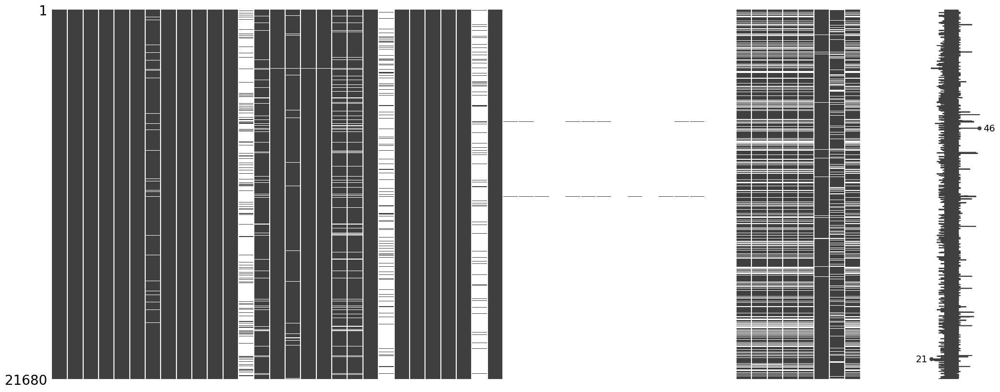

In [ ]:
msno.matrix(dados)
#atravez da analize da matriz conseguimos perceber de as informações de PLACA_VEICULO , UF_VEICULO , CIDADE_VEICULO , DESCR_COR_VEICULO ,
# DESCR_MARCA_VEICULO , ANO_FABRICACAO , ANO_MODELO e DESCR_TIPO_VEICULO tiveram informações tiras por pessoas pelas constantes falhas nelas
# tendo como enfaxe a coluna ANO_MODELO de teve tambem falha na coleta. 

In [ ]:
#Atraves da analise da matrix podemos encontra uma falta total ou quase totalmente de informação de algumas colunas
dados = dados.drop(columns=['TIPOPESSOA' , 'VITIMAFATAL' ,'NACIONALIDADE' , 'NATURALIDADE' , 'SEXO' , 'DATANASCIMENTO' , 'IDADE' , 'ESTADOCIVIL' , 'PROFISSAO' , 'GRAUINSTRUCAO' , 'CORCUTIS' , 'NATUREZAVINCULADA' , 'TIPOVINCULO' , 'RELACIONAMENTO' , 'PARENTESCO' ,'QUANT_CELULAR' , 'MARCA_CELULAR'])

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel da coluna ANO_BO
#Nessa columa nao houve a necessidade de efetuar a alterção da variavel e nem de tratar os dados missing

dados.ANO_BO.describe()

count    21680.000000
mean      2021.999400
std          0.024481
min       2021.000000
25%       2022.000000
50%       2022.000000
75%       2022.000000
max       2022.000000
Name: ANO_BO, dtype: float64

In [ ]:
#Nesse codigo, efetuei a demonstração do outliers da coluna ANO_BO

px.box(dados.ANO_BO)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'hovertemplate': 'variable=%{x}<br>value=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'box',
              'x': array(['ANO_BO', 'ANO_BO', 'ANO_BO', ..., 'ANO_BO', 'ANO_BO', 'ANO_BO'],
                         dtype=object),
              'x0': ' ',
              'xaxis': 'x',
              'y': array([2022, 2022, 2022, ..., 2022, 2022, 2022], dtype=int64),
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'variable'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'value'}}}
})

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel da coluna NUM_BO

dados.NUM_BO.describe()

count    2.168000e+04
mean     6.079005e+04
std      1.622072e+05
min      1.000000e+00
25%      2.180000e+02
50%      5.680000e+02
75%      1.353250e+03
max      2.528472e+06
Name: NUM_BO, dtype: float64

In [ ]:
#Nesse codigo estou alterando o tipo da variavel para str
#E não houve necessidade de tratar os missing e nem outliers pois trata-se de str

dados.NUM_BO = dados.NUM_BO.astype(str)

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel NUMERO_BOLETIM
#Nessa coluna não ha necessidade de alterar o tipo de variavel e nem tratar os missing e nem outliers pois trata-se de str

dados.NUMERO_BOLETIM.describe()

count       21680
unique       5170
top       58/2022
freq           84
Name: NUMERO_BOLETIM, dtype: object

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel da coluna BO_INICIADO
#Nessa coluna não ha necessidade de alterar o tipo de variavel e nem tratar os missing e nem outliers pois trata-se de str

dados.BO_INICIADO.describe()

count               21680
unique               9956
top       21/01/202209.33
freq                   42
Name: BO_INICIADO, dtype: object

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel da coluna BO_EMI
#Nessa coluna não ha necessidade de alterar o tipo de variavel e nem tratar os missing e nem outliers pois trata-se de str

dados.BO_EMITIDO.describe()

count               21680
unique              10000
top       21/01/202217.09
freq                   42
Name: BO_EMITIDO, dtype: object

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel da coluna DATAOCORRENCIA
#Nessa coluna não ha necessidade de alterar o tipo de variavel e nem tratar os missing os missing e nem outliers pois trata-se de str

dados.DATAOCORRENCIA.describe()

count          21680
unique           224
top       08/03/2022
freq             401
Name: DATAOCORRENCIA, dtype: object

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel da coluna HORAOCORRENCIA

dados.HORAOCORRENCIA.describe()

count     20874
unique      841
top       21.00
freq        470
Name: HORAOCORRENCIA, dtype: object

In [ ]:
#Nesse codigo estamos tratando os missing da coluna HORAOCORRENCIA

dados.HORAOCORRENCIA.fillna('Nao informado',inplace = True)

<Axes: >

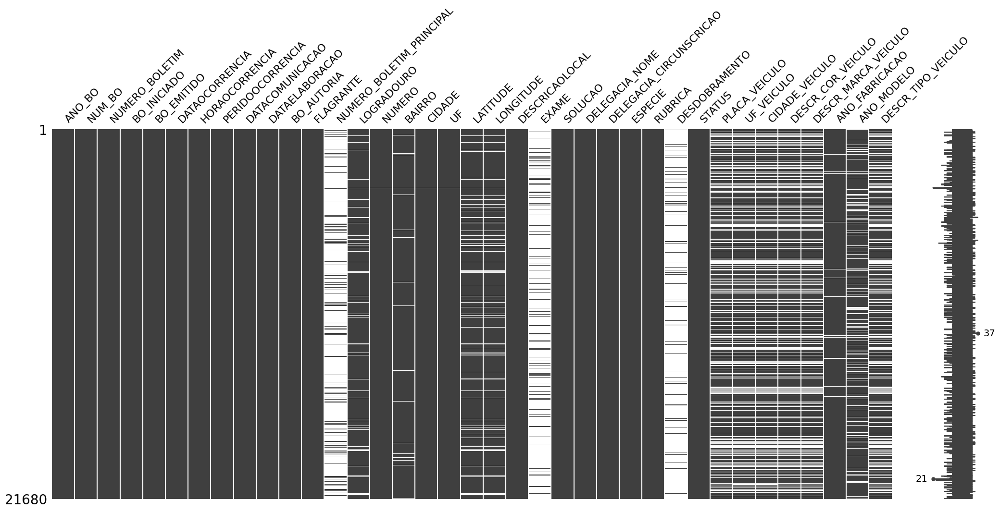

In [ ]:
#Nesse codigo estamos demonstrando o tratamento efetuado  da coluna HORAOCORRENCIA

msno.matrix(dados)

In [ ]:
#Nesse codigo estou demonstrando os outliers referente a tabela HORAOCORRENCIA

px.box(dados.HORAOCORRENCIA)

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel.
#Nessa coluna não ha necessidade de alterar o tipo de variavel e nem tratar os missing

dados.PERIDOOCORRENCIA.describe()

count      21680
unique         5
top       ANOITE
freq        8378
Name: PERIDOOCORRENCIA, dtype: object

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel da coluna DATACOMUNICACAO
#Nessa coluna não ha necessidade de alterar o tipo de variavel e nem tratar os missing os missing e nem outliers pois trata-se de str

dados.DATACOMUNICACAO.describe()

count          21680
unique           120
top       24/03/2022
freq             385
Name: DATACOMUNICACAO, dtype: object

In [ ]:
#Nesse codigo estou descrevendo qual o tipo da variavel da coluna DATAELABORACAO
#Nessa coluna não ha necessidade de alterar o tipo de variavel e nem tratar os missing os missing e nem outliers pois trata-se de str

dados.DATAELABORACAO.describe()

count               21680
unique               9956
top       21/01/202209.33
freq                   42
Name: DATAELABORACAO, dtype: object

## Tratando as colunas Colunas 11 a 21 da base modificada:
BO_AUTORIA,	FLAGRANTE,	NUMERO_BOLETIM_PRINCIPAL,	LOGRADOURO,	NUMERO,	BAIRRO,	CIDADE,	UF,	LATITUDE e LONGITUDE

<Axes: >

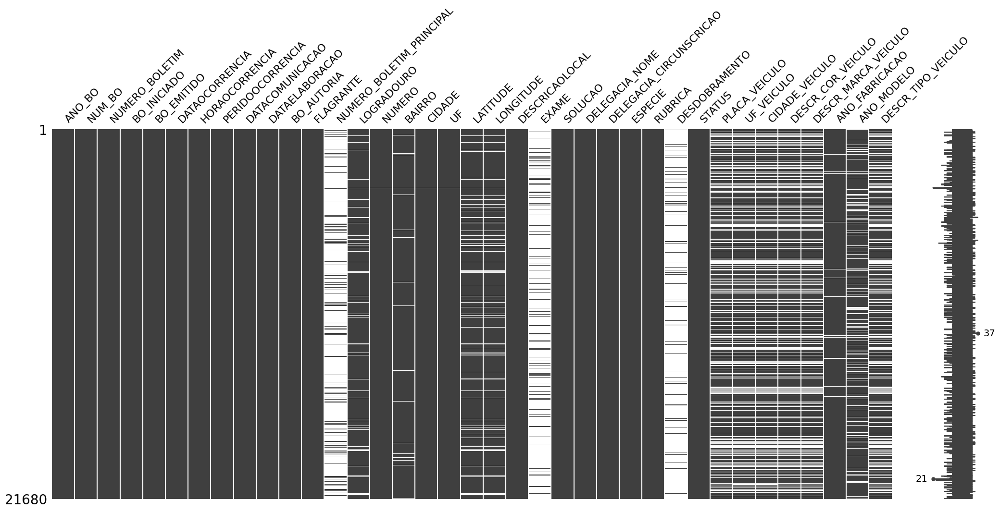

In [ ]:
#Mostrando a matriz após o tratamento das colunas com falta de informação
msno.matrix(dados)

In [ ]:
dados.BO_AUTORIA.describe()
#Percebemos então que a coluna BO_AUTORIA é uma string com todos os registros na matriz, sem necessidade de tratamento

count            21680
unique               3
top       Desconhecida
freq             16951
Name: BO_AUTORIA, dtype: object

In [ ]:
dados.FLAGRANTE.describe()

#Coluna é uma string, sem necessidade de tratamento

count     21680
unique        2
top         Nao
freq      18329
Name: FLAGRANTE, dtype: object

In [ ]:
dados.FLAGRANTE
#mostrando dados da coluna

0        Nao
1        Nao
2        Nao
3        Nao
4        Nao
        ... 
21785    Nao
21786    Nao
21787    Nao
21788    Nao
21789    Nao
Name: FLAGRANTE, Length: 21680, dtype: object

In [ ]:
dados.NUMERO_BOLETIM_PRINCIPAL
#mostrando dados da coluna

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
21785    NaN
21786    NaN
21787    NaN
21788    NaN
21789    NaN
Name: NUMERO_BOLETIM_PRINCIPAL, Length: 21680, dtype: object

In [ ]:
#Tratando dados missing de variável string da coluna NUMERO_BOLETIM_PRINCIPAL

dados.NUMERO_BOLETIM_PRINCIPAL.fillna('Nao registrado',inplace = True)

<Axes: >

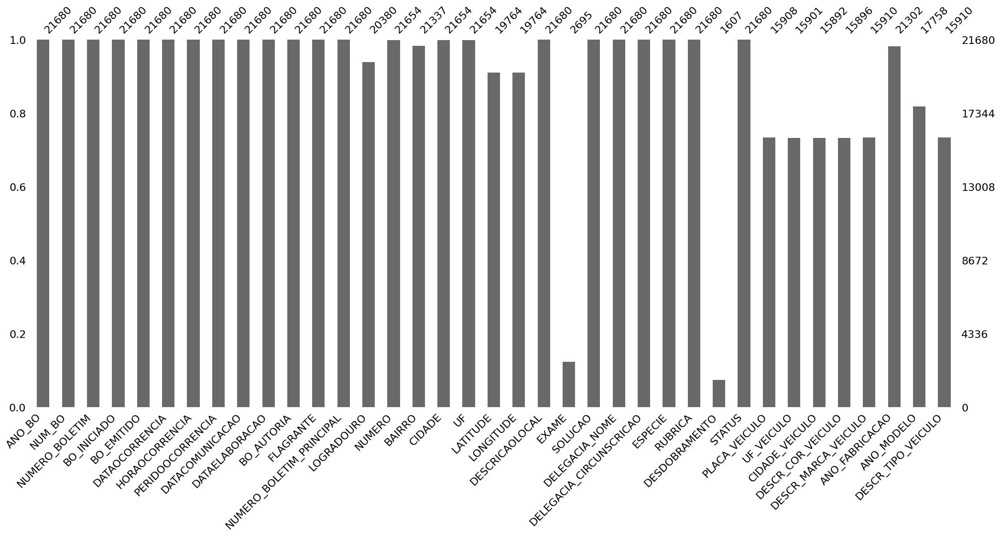

In [ ]:
msno.bar(dados)
#Percebemos que a coluna LOGRADOURO em algumas linhas não tem registros

In [ ]:
dados.LOGRADOURO.fillna('Nao informado',inplace = True)
#Tratando dados da coluna de string

In [ ]:
dados.NUMERO.describe()
#Coluna NUMERO está como variável float, devemos trocar para string e preencher os campos vazios como não informado

count    2.165400e+04
mean     1.450898e+05
std      1.178978e+07
min      0.000000e+00
25%      4.200000e+01
50%      1.600000e+02
75%      5.660000e+02
max      1.000000e+09
Name: NUMERO, dtype: float64

In [ ]:
dados.NUMERO = dados.NUMERO.astype(str)

In [ ]:
dados.NUMERO.describe()
#tipo de dado da coluna tratado

count     21680
unique     2016
top         0.0
freq       1482
Name: NUMERO, dtype: object

In [ ]:
dados.NUMERO.replace({"0":"Nao informado"})

0         221.0
1         777.0
2         300.0
3        1386.0
4          70.0
          ...  
21785    3900.0
21786     400.0
21787    1695.0
21788       0.0
21789     221.0
Name: NUMERO, Length: 21680, dtype: object

In [ ]:
dados.NUMERO.fillna('Nao informado',inplace = True)
#Tratamento da coluna NUMERO realizado

In [ ]:
dados.NUMERO.describe()

count     21680
unique     2016
top         0.0
freq       1482
Name: NUMERO, dtype: object

In [ ]:
dados.BAIRRO.describe()
#Dados faltantes na coluna bairro

count      21337
unique      3000
top       CENTRO
freq         609
Name: BAIRRO, dtype: object

In [ ]:
# Os registros de roubo de celulares acontecem mais no bairro do CENTRO segundo a análise realizada 
dados.BAIRRO.mode()

0    CENTRO
Name: BAIRRO, dtype: object

In [ ]:
# Tratando dados faltantes coluna BAIRRO
dados.BAIRRO.fillna('Nao informado',inplace = True)

In [ ]:
dados.BAIRRO.describe()

count      21680
unique      3001
top       CENTRO
freq         609
Name: BAIRRO, dtype: object

In [ ]:
#Coluna CIDADE
dados.CIDADE.describe()

count       21654
unique        272
top       S.PAULO
freq         8232
Name: CIDADE, dtype: object

In [ ]:
#Tratando dados missing coluna CIDADE
dados.CIDADE.fillna('Nao informado',inplace = True)

In [ ]:
dados.UF.describe()
#Dados missing serão substítuidos por SP

count     21654
unique        1
top          SP
freq      21654
Name: UF, dtype: object

In [ ]:
dados.UF.fillna('SP',inplace = True)

<Axes: >

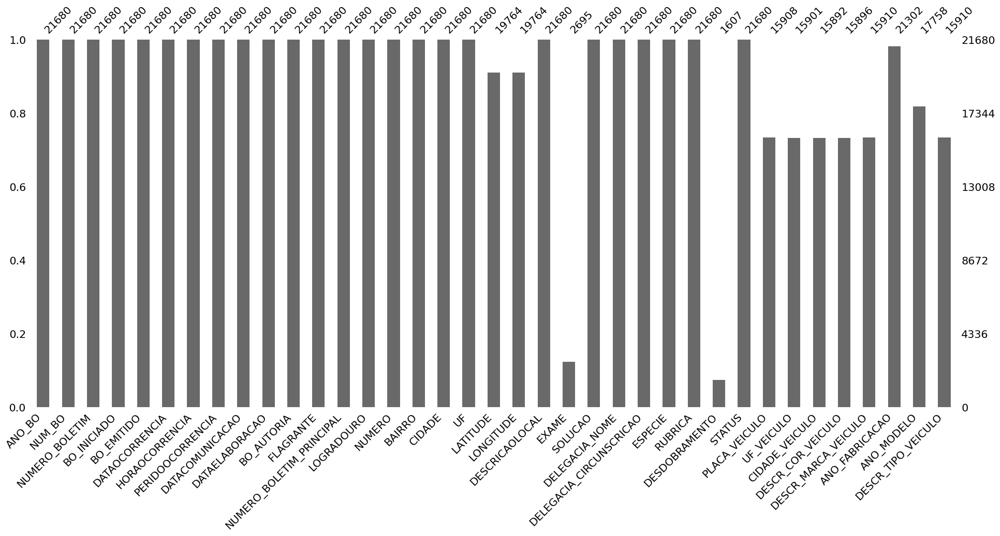

In [ ]:
msno.bar(dados)

<Axes: >

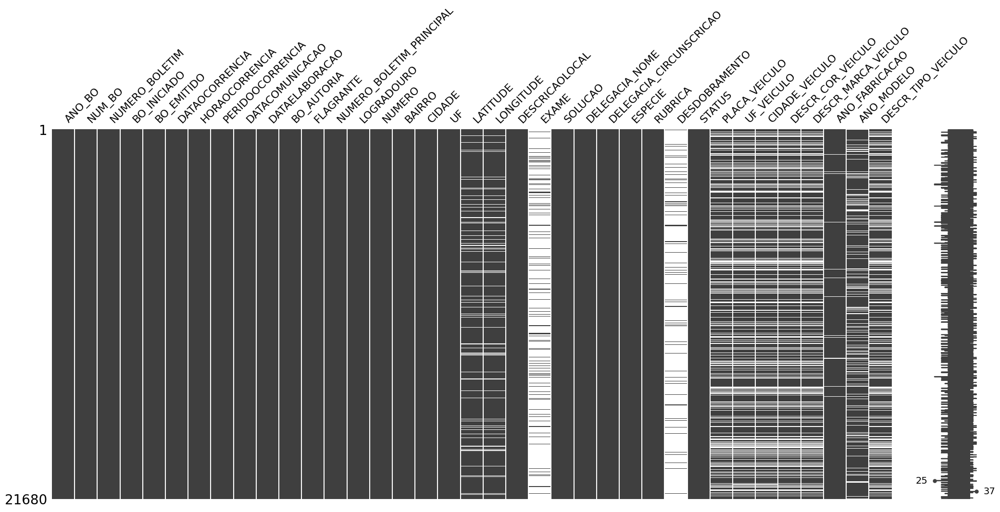

In [ ]:
msno.matrix(dados)

In [ ]:
dados.LATITUDE.describe

<bound method NDFrame.describe of 0         -23.6098735
1         -23.8383584
2        -23.76193715
3         -23.6655905
4           -23.67584
             ...     
21785             NaN
21786    -23.72167563
21787    -23.65068228
21788             NaN
21789    -23.31061596
Name: LATITUDE, Length: 21680, dtype: object>

In [ ]:
dados.LONGITUDE.describe

<bound method NDFrame.describe of 0        -46.45756809
1         -46.7936267
2        -46.69759734
3         -46.6783069
4         -46.7749591
             ...     
21785             NaN
21786    -46.67881952
21787    -46.54825549
21788             NaN
21789    -45.98172071
Name: LONGITUDE, Length: 21680, dtype: object>

In [ ]:
#Convertemos as váriavéis LATITUDE e LONGITUDE como variáveis númericas
dados.LATITUDE = dados.LATITUDE.astype(float)
dados.LONGITUDE = dados.LONGITUDE.astype(float)

In [ ]:
#Pegamos os elementos das colunas que possuiam diversos numeros apos a virgula , para somente dois numeros apos a virgula 
#e criamos duas novas colunas para os receber
dados['LATITUDE2']=round(dados.LATITUDE, 2)
dados['LONGITUDE2']=round(dados.LONGITUDE, 2)

<Axes: >

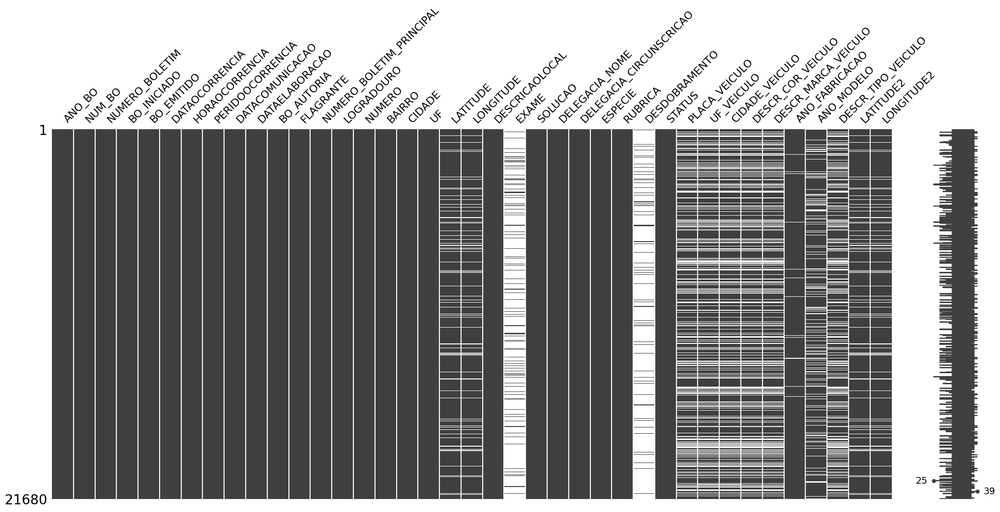

In [ ]:
msno.matrix(dados)

In [ ]:
#Tratando dados missing das duas colunas LATITUDE E LONGITUDE
dados.LATITUDE2.fillna(dados.LATITUDE2.median(),inplace = True)
dados.LONGITUDE2.fillna(dados.LONGITUDE2.median(),inplace = True)

In [ ]:
px.box(dados.LATITUDE2)
#Para as colunas LATITUDE2 e LONGITUDE2 percebemos que não faz sentido realizar o tratamento de outliers

<Axes: >

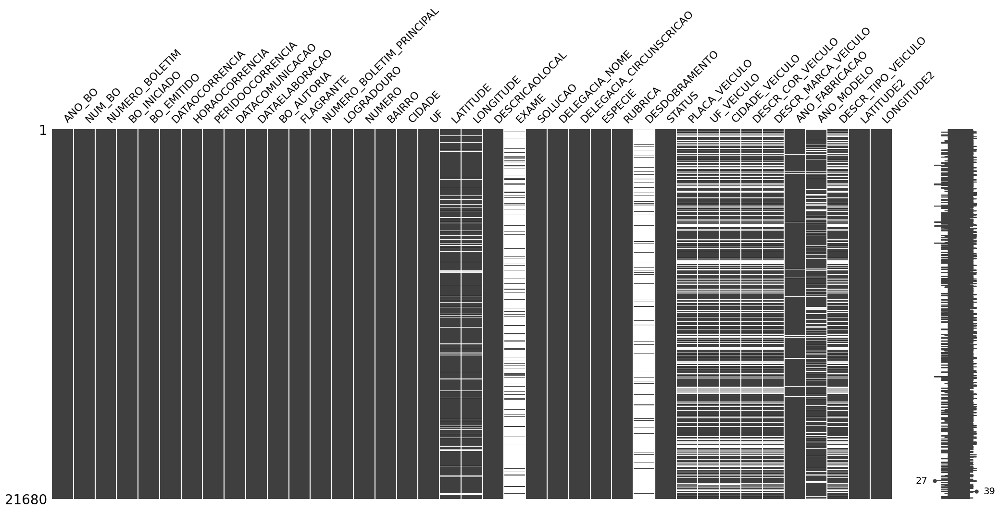

In [ ]:
msno.matrix(dados)

<Axes: >

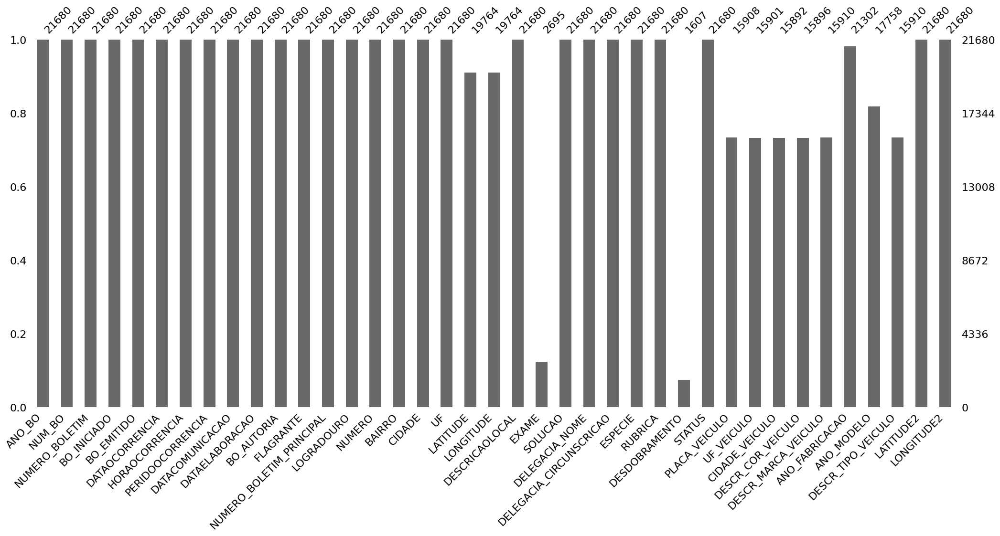

In [ ]:
msno.bar(dados)

In [ ]:
#Coluna sem necessidade de tratamento
dados.DESCRICAOLOCAL.describe()

count          21680
unique            31
top       Viapublica
freq           15446
Name: DESCRICAOLOCAL, dtype: object

In [ ]:
dados.EXAME.describe()

count       2695
unique         3
top       IC-IML
freq        1303
Name: EXAME, dtype: object

In [ ]:
#Colunas com a maior parte de dados faltantes
dados.EXAME.isnull().sum()

18985

In [ ]:
#Variável tratada para não termos perda de dados
dados.EXAME.fillna('Nao informado',inplace = True)

<Axes: >

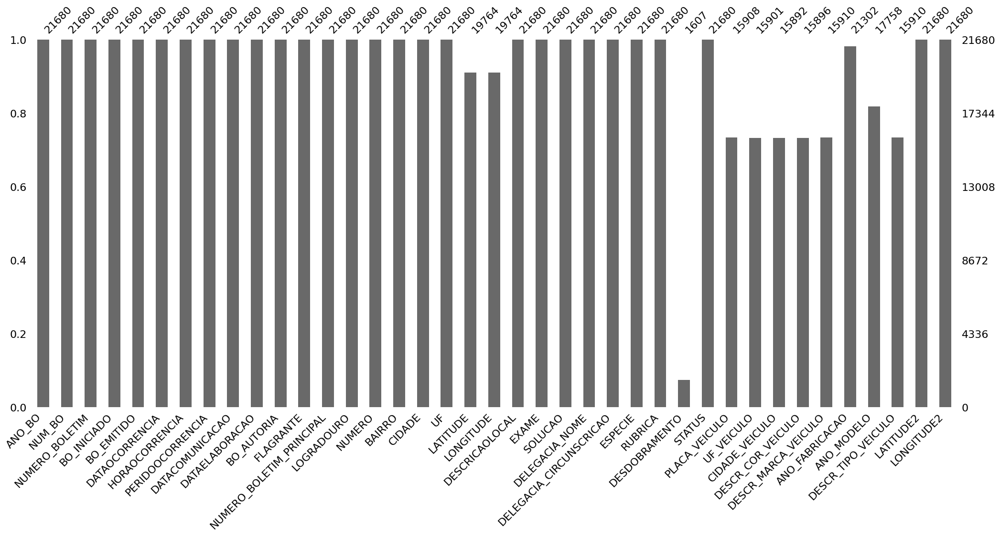

In [ ]:
msno.bar(dados)

In [ ]:
# Colunas B. Trindade #

dados.SOLUCAO.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA SOLUCAO#

count                          21680
unique                            11
top       ENCAMINHAMENTODPÁREADOFATO
freq                            6810
Name: SOLUCAO, dtype: object

In [ ]:
dados.SOLUCAO.fillna('Nao informado',inplace = True)

In [ ]:
dados.DELEGACIA_NOME.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA DELEGACIA_NOME#

count                   21680
unique                    548
top       DELEGACIAELETRONICA
freq                     3500
Name: DELEGACIA_NOME, dtype: object

In [ ]:
dados.DELEGACIA_NOME.fillna('Nao informado',inplace = True)

In [ ]:
dados.DELEGACIA_CIRCUNSCRICAO.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA DELEGACIA_CIRCUSCRICAO#

count                21680
unique                 610
top       49ºD.P.SAOMATEUS
freq                   374
Name: DELEGACIA_CIRCUNSCRICAO, dtype: object

In [ ]:
dados.DELEGACIA_CIRCUNSCRICAO.fillna('Nao informado',inplace = True)

In [ ]:
dados.ESPECIE.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA ESPECIE#

count                                 21680
unique                                   24
top       TituloII-Patrimonio(arts.155a183)
freq                                  15816
Name: ESPECIE, dtype: object

In [ ]:
dados.ESPECIE.fillna('Nao informado',inplace = True)

In [ ]:
dados.RUBRICA.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA RUBRICA#

count                      21680
unique                       108
top       Roubo(art.157)-VEICULO
freq                       13825
Name: RUBRICA, dtype: object

In [ ]:
dados.RUBRICA.fillna('Nao informado',inplace = True)

In [ ]:
dados.DESDOBRAMENTO.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA DESDOBRAMENTO#

count                                                  1607
unique                                                   17
top       caput.Subtraircoisamovelalheia.mediantegraveam...
freq                                                    950
Name: DESDOBRAMENTO, dtype: object

In [ ]:
dados.DESDOBRAMENTO.fillna('Roubo não relatado',inplace = True)

In [ ]:
dados.STATUS.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA STATUS#

count         21680
unique            1
top       Consumado
freq          21680
Name: STATUS, dtype: object

In [ ]:
dados.STATUS.fillna('Nao informado',inplace = True)

In [ ]:
dados.PLACA_VEICULO.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA PLACA_VEICULO#

count     15908
unique    10137
top           0
freq         28
Name: PLACA_VEICULO, dtype: object

In [ ]:
dados.PLACA_VEICULO.fillna('Nao informado',inplace = True)

In [ ]:
dados.UF_VEICULO.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA UF_VEICULO#

count     15901
unique       26
top          SP
freq      13808
Name: UF_VEICULO, dtype: object

In [ ]:
dados.UF_VEICULO.fillna('Nao informado',inplace = True)

In [ ]:
dados.CIDADE_VEICULO.describe()

#NESTE CAMPO ESTAMOS TRATANDO OS DADOS DA COLUNA CIDADE_VEICULO#

count       15892
unique        713
top       S.PAULO
freq         4092
Name: CIDADE_VEICULO, dtype: object

In [ ]:
dados.CIDADE_VEICULO.fillna('Nao informado',inplace = True)

<Axes: >

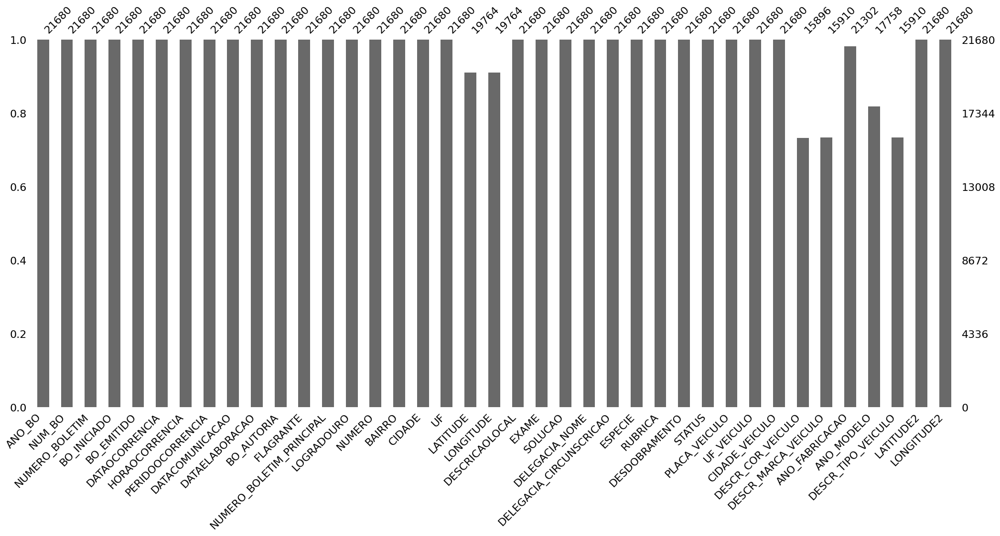

In [ ]:
msno.bar(dados)

In [ ]:
#A Coluna é uma String
dados.DESCR_COR_VEICULO.describe()

count      15896
unique        15
top       Branco
freq        4725
Name: DESCR_COR_VEICULO, dtype: object

In [ ]:
#substituindo todos os dados nulos da coluna DESCR_COR_VEICULO por Nao informado
dados.DESCR_COR_VEICULO.fillna('Nao informado',inplace = True)

In [ ]:
#A Coluna é uma String
dados.DESCR_MARCA_VEICULO.describe()

count              15910
unique              2516
top       HONDA/CG160FAN
freq                 437
Name: DESCR_MARCA_VEICULO, dtype: object

In [ ]:
#substituindo todos os dados nulos da coluna DESCR_MARCA_VEICULO por Nao informado
dados.DESCR_MARCA_VEICULO.fillna('Nao informado',inplace = True)

In [ ]:
#A Coluna ja é um float e por isto desidimons analizar se possui um outlier
dados.ANO_FABRICACAO.describe()

count    21302.000000
mean      1478.390386
std        889.859890
min          0.000000
25%          0.000000
50%       2012.000000
75%       2018.000000
max       2022.000000
Name: ANO_FABRICACAO, dtype: float64

In [ ]:
#apos analizar o box descobrimor o outlier 0
px.box(dados.ANO_FABRICACAO)

In [ ]:
#Decidimos pegar o valor minimo do ano fabricaçao de é 1968 e todos de são menores desta data os transformamos como não registrado
dados.loc[dados.ANO_FABRICACAO<1968, 'ANO_FABRICACAO']="não registrado"

In [ ]:
#para substituir todos os valores nulos por não registrado pois nenhumas das colunas antes ou depois em suas linhas 
dados.ANO_FABRICACAO.fillna("não registrado",inplace = True)

In [ ]:
#para chegar novamente
px.box(dados.ANO_FABRICACAO)

In [ ]:
dados.ANO_FABRICACAO.describe()

count              21680
unique                51
top       não registrado
freq                6043
Name: ANO_FABRICACAO, dtype: object

In [ ]:
px.box(dados.ANO_MODELO)

In [ ]:
#Decidimos pegar o valor minimo do ano modelo de é 1968 e todos de são menores desta data os transformamos como não registrado
dados.loc[dados.ANO_MODELO<1968, 'ANO_MODELO']="não registrado"

In [ ]:
#para substituir todos os valores nulos por não registrado pois nenhumas das colunas antes ou depois em suas linhas 
dados.ANO_MODELO.fillna("não registrado",inplace = True)

In [ ]:
px.box(dados.ANO_MODELO)

In [ ]:
dados.DESCR_TIPO_VEICULO.describe()

count         15910
unique           17
top       AUTOMOVEL
freq           6768
Name: DESCR_TIPO_VEICULO, dtype: object

In [ ]:
dados.DESCR_TIPO_VEICULO.fillna('Nao informado',inplace = True)

In [ ]:
dados = dados.replace({
                ",":'.',
                ":":'.',
                'á':'a','ã':'a', 'â':'a', 'í':'i',
                'ÅŸ':'s',
                'Ä°':'I',
                'Ä±':'i',
                'Ã¶':'o',
                'Ã§':'c',
                'ÄŸ':'g',
                'Ã¼':'u',
                'Ã©':'e',
                'Ã¡':'a',
                'Ã³':'o',
                'Ã±':'nh',
                '&':'',
                'Ã…Ë†':'n',
                'Ã§':'c',
                ' ':'',
                'Ã­':'i',
                'Ã£':'a',
                'Ãº':'u',
                'Ã':'a',
                'Ãª':'e',
                'Ã‘':'N',
                'aÂ¢':'a',
                'aÂª':'e',
                'aÂ':'a',
                "á":"a",
                "é":"e",
                "í":"i",
                "ó":"o",
                "ú":"u",
                "ã":"a",
                "õ":"o",
                "aª":"e",
                "á":"a",
                "é":"e",
                "í":"i",
                "ó":"o",
                "ú":"u",
                "ã":"a",
                "õ":"o",
                "ê":"e",
                "â":"a",
                "ô":"o",
                "ê":"e",
                "â":"a",
                "ô":"o"              
              
              }, regex=True)

<Axes: >

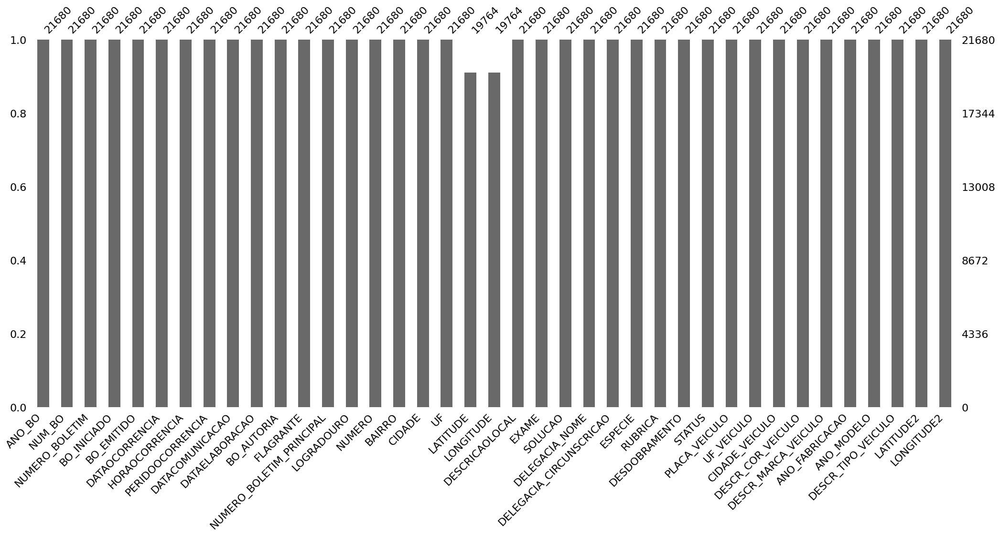

In [ ]:
msno.bar(dados)

<Axes: >

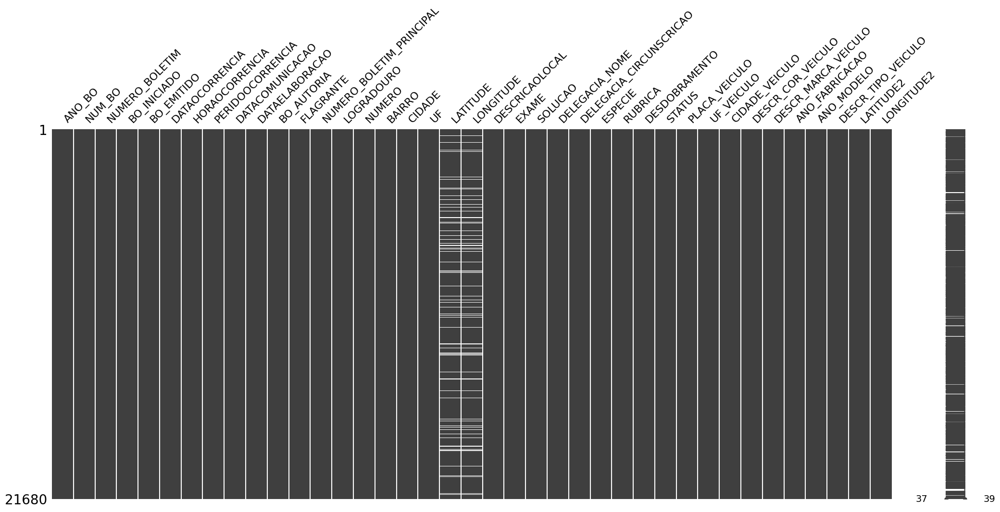

In [ ]:
msno.matrix(dados)

In [ ]:
df_filtrado = dados.nlargest(10, 'BAIRRO')

In [22]:
#Filtrando colunas que iremos utilizar para fazer o streamlit
df1 = pd.read_csv('../1_bases_tratadas/roubo_veiculos_3.csv',sep=';')
df1= df2[['Data_Ocorrencia','Periodo_Ocorrencia','Cidade',
                'Flagrante','Descr_Automovel']]

In [23]:
df1.to_csv('../1_bases_tratadas/roubo_veiculos_tratado.csv' , sep=';' , encoding='utf-8' , index= False)

In [ ]:
#Criando Banco de dados
engine =db.create_engine('sqlite:///Roubos_Veiculos2022.db',echo=True)

In [ ]:
#Criando conexão
conn = engine.connect()

In [ ]:
metadata = db.MetaData()

In [ ]:
#Enviando arquivos para o banco de dados

#enviando arquivos do mês de janeiro
df1 = pd.read_csv('../1_bases_tratadas/roubo_veiculos_tratado.csv',delimiter=';')
df1.to_sql('Roubos_Veiculos',conn,if_exists='replace',index=False)

2023-06-02 19:34:46,231 INFO sqlalchemy.engine.Engine BEGIN (implicit)
2023-06-02 19:34:46,246 INFO sqlalchemy.engine.Engine PRAGMA main.table_info("Roubos_Veiculos")
2023-06-02 19:34:46,248 INFO sqlalchemy.engine.Engine [raw sql] ()
2023-06-02 19:34:46,255 INFO sqlalchemy.engine.Engine PRAGMA temp.table_info("Roubos_Veiculos")
2023-06-02 19:34:46,257 INFO sqlalchemy.engine.Engine [raw sql] ()
2023-06-02 19:34:46,264 INFO sqlalchemy.engine.Engine 
CREATE TABLE "Roubos_Veiculos" (
	"DATAOCORRENCIA" TEXT, 
	"HORAOCORRENCIA" TEXT, 
	"PERIDOOCORRENCIA" TEXT, 
	"BAIRRO" TEXT, 
	"CIDADE" TEXT, 
	"FLAGRANTE" TEXT, 
	"SOLUCAO" TEXT, 
	"DELEGACIA_NOME" TEXT, 
	"ESPECIE" TEXT, 
	"RUBRICA" TEXT, 
	"DESCR_MARCA_VEICULO" TEXT, 
	"ANO_FABRICACAO" TEXT, 
	"DESCR_TIPO_VEICULO" TEXT
)


2023-06-02 19:34:46,265 INFO sqlalchemy.engine.Engine [no key 0.00140s] ()
2023-06-02 19:34:47,139 INFO sqlalchemy.engine.Engine INSERT INTO "Roubos_Veiculos" ("DATAOCORRENCIA", "HORAOCORRENCIA", "PERIDOOCORRENCIA", "BA

21680